# Cześć!

Ten notebook przygotowaliśmy specjalnie dla Ciebie, żeby pokazać Ci jak może wyglądać przykładowa analiza danych z wykorzystaniem Pythona. **Narzędzie jest w pełni interaktywne, także śmiało możesz się bawić ** :) 

Na warsztat wzięliśmy dane dotyczące epidemii wirusa COVID-19.

Gdybyś chciał taki notebook zainstalować u siebie na komputerze, to poniżej znajdziesz poradnik jak to zrobić:

Zapraszamy też na naszą stronę: https://zostananalitykiemdanych.pl

Pozdrawiamy!

Piotr i Krzysztof

## Wczytywanie danych

Python może wczytywać dane z wielu różnych źródeł (plików, baz danych, serwerów www itp). Dlatego trzeba dobrać odpowiedna imetodę wczytywania do konkretnego źródła. Zaletą takiego podejścia jest to, że w Pythonie możemy łatwo łączyć ze sobą dane z wielu różnych miejsc.

W naszym przykładzie dane wczytany z pliku .csv dostępnego pod następującym adresem ur:

In [1]:
file_url = "https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv"

In [2]:
import pandas as pd 
import plotly.express as px
import numpy as np

data = pd.read_csv(file_url)
data


,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87945,ZWE,Africa,Zimbabwe,2021-05-08,38414.0,11.0,22.000,1576.0,0.0,1.143,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
87946,ZWE,Africa,Zimbabwe,2021-05-09,38419.0,5.0,19.714,1576.0,0.0,0.857,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
87947,ZWE,Africa,Zimbabwe,2021-05-10,38433.0,14.0,20.000,1576.0,0.0,0.429,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
87948,ZWE,Africa,Zimbabwe,2021-05-11,38448.0,15.0,17.286,1579.0,3.0,0.714,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571


W naszym zbiorze znajdują się nie tylko dane dla krajów, ale także agregaty dla kontynentów i całego świata. Chcemy przedstawić wykresy dla krajów, dlatego przygotowujemy dataframe data_kraje - zawierający jedynie dane dot. krajów. Analizując nasz dataset można zauwazyć, że wiersze, gdzie wartość location jest równa np. World czy Europe mają wartość kolumny continent== Nan - wystarczy więc odfiltrować te wiersze gdzie continent ma wartość NaN. Sprawdzenie czy wartość jest Nullem (NaNem) możemy wykonać komedą pd.isnull(). Jako że chcemy uwzględnić tylko te elementy które NIE są Nullami negujemy warunek tyldą '~'
Przygotujemy też ramkę data_kontynenty na potrzeby analizy w skali kontentów.

In [3]:
data_kraje=data[~pd.isnull(data['continent'])]
data_kontynenty=data[(data['location']=='Europe')|(data['location']=='Africa')|(data['location']=='Asia')|(data['location']=='South America')|(data['location']=='North America')|(data['location']=='Oceania')]

In [64]:
znane_kraje=data_kraje['location'].unique()#tworzymy listę występujących krajów
znane_daty=data_kraje['date'].unique()#tworzymy listę występujących dat

znane_kontynenty=data_kraje['continent'].unique()#będziemy chcieli mieć możliwość filtrować po nazwach kontynentów
znane_kontynenty=np.append(znane_kontynenty,'dowolny')#ale również spojrzeć globalnie

In [65]:
znane_kontynenty

array(['Asia', 'Europe', 'Africa', 'North America', 'South America',
       'Oceania', 'dowolny'], dtype=object)

In [66]:
#instalacja jupyter-dash - nie wystarczy conda install jupyter_dash, w gui anaconda brak jupyter dash. Wymagana komenda to:
#conda install -c plotly jupyter-dash
#https://anaconda.org/plotly/jupyter-dash
#u mnie instalacja powiodła się dopiero po uruchomieniu anaconda prompt jako admin

In [4]:
import dash
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
import time
import datetime

In [68]:
#https://stackoverflow.com/questions/51063191/date-slider-with-plotly-dash-does-not-work
#Plotly-Dash does currently not support datetime objects.
#więc trzeba zrobić obejście i z dat przejść na liczby(timestampy)

def unixTimeMillis(dt):
    ''' Convert datetime to unix timestamp '''
    return int(time.mktime(dt.timetuple()))

def unixToDatetime(unix):
    ''' Convert unix timestamp to datetime. '''
    return pd.to_datetime(unix,unit='s').strftime('%Y-%m-%d')

def getMarks(Nth=35):
    ''' Returns the marks for labeling. 
        Every Nth value will be used.
    '''

    result = {}
    daterange=pd.date_range(start='2020',end=datetime.datetime.now().strftime('%Y-%m-%d'),freq='d')                     
    for i, date in enumerate(daterange):
        if(i%Nth == 1):
            # Append value to dict
            result[unixTimeMillis(date)] = str(date.strftime('%Y-%m-%d'))

    return result

In [69]:
# Build App
app = JupyterDash(__name__)
app.layout = html.Div([
    html.Div([
         html.Label('wykres'),
    dcc.Graph(id='crossfilter-indicator-scatter'),]),
    html.Label('Wybór dnia'),
    html.Div(
         

        dcc.Slider(
        id='crossfilter-year--slider',
        marks=getMarks(),
        max=unixTimeMillis(pd.to_datetime(data_kraje['date'].max())),
        min=unixTimeMillis(pd.to_datetime(data_kraje['date'].min())),
        value=unixTimeMillis(pd.to_datetime(data_kraje['date'].max()))
    ),  style={'padding': '0px 20px 20px 20px'})#działania tych styli jeszcze nie czuję
,
 html.Label('Skala wielkości prostokątów'), 
dcc.Dropdown(
                id='wybor_skala_prostokaty',
 options=[
            {'label': 'Nowe przypadki', 'value': 'new_cases'},
            {'label': 'Nowe zgony', 'value': 'new_deaths'},
            {'label': 'Wszystkie przypadki', 'value': 'total_cases'},
            {'label': 'Wszystkie zgony', 'value': 'total_deaths'}
        ],                value='total_cases'
           )
    ,
 html.Label('Skala koloru'), 
dcc.Dropdown(
                id='wybor_skala_koloru',
                 options=[
            {'label': 'Nowe przypadki', 'value': 'new_cases'},
            {'label': 'Nowe zgony', 'value': 'new_deaths'},
            {'label': 'Wszystkie przypadki', 'value': 'total_cases'},
            {'label': 'Wszystkie zgony', 'value': 'total_deaths'}
        ],
                value='new_cases'
            )
    ,
    
 html.Label('Filtruj wg kontynentu'), 

dcc.Dropdown(
                id='wybor_kontynentu',
                options=[{'label': i, 'value': i} for i in znane_kontynenty],
                value='dowolny'
            )
    ,


])
# dla niektórych kombinacji pierwszych dwóch pól dostaję błąd ZeroDivisionError: Weights sum to zero, can't be normalized


In [70]:
# Define callback to update graph
@app.callback(
    Output('crossfilter-indicator-scatter', 'figure'),
    [Input("crossfilter-year--slider", "value"),
    Input("wybor_kontynentu", "value"),
    Input("wybor_skala_koloru", "value"),
    Input("wybor_skala_prostokaty", "value")]
)
def update_figure(dzien,kontynent,skala_kolor,skala_prostokaty):
    wybrany_dzien=unixToDatetime(dzien)
    df_temp=data_kraje[(data_kraje['date']==wybrany_dzien)]
    if kontynent!='dowolny':
        df_temp=df_temp[df_temp['continent']==kontynent]
    return px.treemap(df_temp, path=[px.Constant('world'), 'continent', 'location'], values=skala_prostokaty,
            color=skala_kolor, hover_data=['location'])


In [71]:
app.run_server(mode='inline')
#przy filtracji wg kontynentu nie przelicza skali, a własnie temu miała służyć ta fitlracja

In [72]:
#mapa świata, kropki + animacja. Wersja prostsza (dane dzienne, bez wyliczania tygodniowych agregatow)

In [73]:
data_kraje = data_kraje.dropna(subset=['human_development_index', 'total_cases', 'total_deaths', 'location', 'continent'])
data_kraje=data_kraje[data_kraje['new_cases']>=0]# w danych pojawiają się korekty stąd w kolumnie 'new cases' pojawiaja się wartości ujemne, należy je odfiltrować
data_kraje=data_kraje[data_kraje['new_deaths']>=0]# w danych pojawiają się korekty stąd w kolumnie 'new deaths' pojawiaja się wartości ujemne, należy je odfiltrować

In [74]:
 fig = px.scatter_geo(data_kraje[data_kraje['date']>'2021-04-01'], locations="location", color="continent", hover_name="location", size="new_cases_smoothed",
               animation_frame="date", projection="natural earth",locationmode ='country names' )
#datę ograniczyłem żeby się szybciej ładowało
#.lower() potrzebne bo scope przyjmuje nazwy kontynentów małymi literami
#do wyboru z dasha warto dodać wybór 'scope', na mapie całej ziemi mało widać
#jak dla mnie to jesli się używa 'scope' to powinno się tez wyfiltrować dane dla danego regionu, 
#bo punkty danych dla np. samej europy są małe, bo USA ma największe wartości jeśli chodzi o new cases
#https://plotly.com/python/map-configuration/

fig.show()

In [75]:
#to co wyżej tylko opakowane w appke dasha, można wybierać co jest rysowane, scope

# Build App
app = JupyterDash(__name__)
app.layout = html.Div([
    html.Div([
         html.Label('wykres'),
    dcc.Graph(id='crossfilter-indicator-scatter'),]),
    html.Label('Wybór dnia'),


 html.Label('obrazuj_kolkami'), 
dcc.Dropdown(
                id='co_rysowane',
 options=[
    {'label': 'Nowe przypadki wygładzone', 'value': 'new_cases_smoothed'},
            {'label': 'Nowe przypadki', 'value': 'new_cases'},
            {'label': 'Nowe zgony_wygładzone', 'value': 'new_deaths_smoothed'},
            {'label': 'Nowe zgony', 'value': 'new_deaths'},
            {'label': 'Wszystkie przypadki', 'value': 'total_cases'},
            {'label': 'Wszystkie zgony', 'value': 'total_deaths'}
        ],                value='new_cases_smoothed'
           )
    ,
 html.Label('hoover'), 
dcc.Dropdown(
                id='hoover',
                 options=[
            {'label': 'Nazwa kraju', 'value': 'location'},
            {'label': 'Nowe przypadki wygładzone', 'value': 'new_cases_smoothed'},
            {'label': 'Nowe przypadki', 'value': 'new_cases'},
            {'label': 'Nowe zgony_wygładzone', 'value': 'new_deaths_smoothed'},
            {'label': 'Nowe zgony', 'value': 'new_deaths'},
            {'label': 'Wszystkie przypadki', 'value': 'total_cases'},
            {'label': 'Wszystkie zgony', 'value': 'total_deaths'}
        ],
                value='location'
            )
    ,
    
 html.Label('scope'), 

dcc.Dropdown(
                id='wybor_kontynentu',
              options=[
            {'label': 'Świat', 'value': 'world'},
            {'label': 'Afryka', 'value': 'africa'},
            {'label': 'Europa', 'value': 'europe'},
            
            {'label': 'Ameryka Poludniowa', 'value': 'south america'},
            {'label': 'Ameryka Północna', 'value': 'north america'},
            {'label': 'Azja', 'value': 'asia'}
        ],
                value='world'
            )
    ,


])
# dla niektórych kombinacji pierwszych dwóch pól dostaję błąd ZeroDivisionError: Weights sum to zero, can't be normalized


In [76]:
# Define callback to update graph
@app.callback(
    Output('crossfilter-indicator-scatter', 'figure'),
    [
    Input("wybor_kontynentu", "value"),
    Input("co_rysowane", "value"),
    Input("hoover", "value")]
)
def update_figure(kontynent,co_rysowane,hoover):
    df_temp=data_kraje[data_kraje['date']>'2021-04-01']
  #  df_temp=df_temp[df_temp['date']>'2021-04-01']
    return px.scatter_geo(data_kraje[data_kraje['date']>'2021-04-01'], locations="location", color="continent", hover_name=hoover, size=co_rysowane,
               animation_frame="date", projection="natural earth",locationmode ='country names',scope=kontynent )
#analogiczny problem z tym scope'em jest (zarówno przy parametrze scope jak i podaniu do rysowania odfiltrowanej do danego kontynentu ramki) - 
#kólka są wyskalowane do największej wartości w ramce, czyli Indie/Brazylia/Usa


In [77]:
app.run_server(mode='inline')


In [78]:

data2 = data_kraje.dropna(subset=['human_development_index', 'total_cases', 'total_deaths', 'location', 'continent'])
data2['year_week']=pd.to_datetime(data2['date']).dt.strftime('%Y-%U')
data2["year_month"] = data2["date"].str.slice(0,7)
data2["year_month"].unique()


array(['2020-03', '2020-04', '2020-05', '2020-06', '2020-07', '2020-08',
       '2020-09', '2020-10', '2020-11', '2020-12', '2021-01', '2021-02',
       '2021-03', '2021-04', '2021-05', '2020-01', '2020-02'],
      dtype=object)

Jak widać powyżej biór danych (dataset) z którego korzystamy 

In [79]:
data2=data.pivot(index='date',columns=['location'], values=['new_cases'])
data2.columns=data2.columns.droplevel(0) #po użyciu pivot'a pojawił się dodatkowy poziom kolumn (new_cases) - usuwamy go
data2.reset_index(level=0, inplace=True) #bez tego indeksem jest 'date' i przy korzystaniu z dasha po nazwach kolumn rzuca błąd że nie ma takiej kolumny
data2["year_month"] = data2["date"].str.slice(0,7)
data2['year_week']=pd.to_datetime(data2['date']).dt.strftime('%Y-%U')
data2["year_month"].unique()
      

array(['2020-01', '2020-02', '2020-03', '2020-04', '2020-05', '2020-06',
       '2020-07', '2020-08', '2020-09', '2020-10', '2020-11', '2020-12',
       '2021-01', '2021-02', '2021-03', '2021-04', '2021-05'],
      dtype=object)

In [80]:

import plotly.express as px

In [88]:
gdzie='India'
fig_ts = px.line(data2,
x='date',
y="India")

fig_ts.update_layout(xaxis_type='date',
xaxis={
'title': 'Data'
},
yaxis={
'title': 'Nowe przypadki',
'type': 'linear',
},
title_text='Zakażenia w '+gdzie)

In [82]:
df_grouped = data.groupby(['location'], as_index=False).sum()

In [83]:
df_grouped.reset_index(level=0, inplace=True)

In [84]:
#df_grouped.rename(columns={'index': 'Date'}, inplace=True)

In [85]:
fig_fs_pie = px.pie(df_grouped[df_grouped['new_cases']>3000000],
values='new_cases',
names='location',
title='liczba przypadków na swiecie',
template='ggplot2')

https://plotly.com/python/animations/

In [86]:
pd.set_option('display.max_rows', 100)
tmp = data.groupby("location")[["total_cases"]].mean()
tmp.sort_values(by=["total_cases"]).dropna().reset_index().head(100)

,location,total_cases
0,Micronesia (country),1.000000
1,Vanuatu,1.836957
2,Samoa,2.443182
3,Marshall Islands,3.736041
4,Solomon Islands,16.328638
5,Vatican,18.459584
6,Saint Kitts and Nevis,24.946860
7,Fiji,40.154762
8,Grenada,67.148681
9,Dominica,67.230216


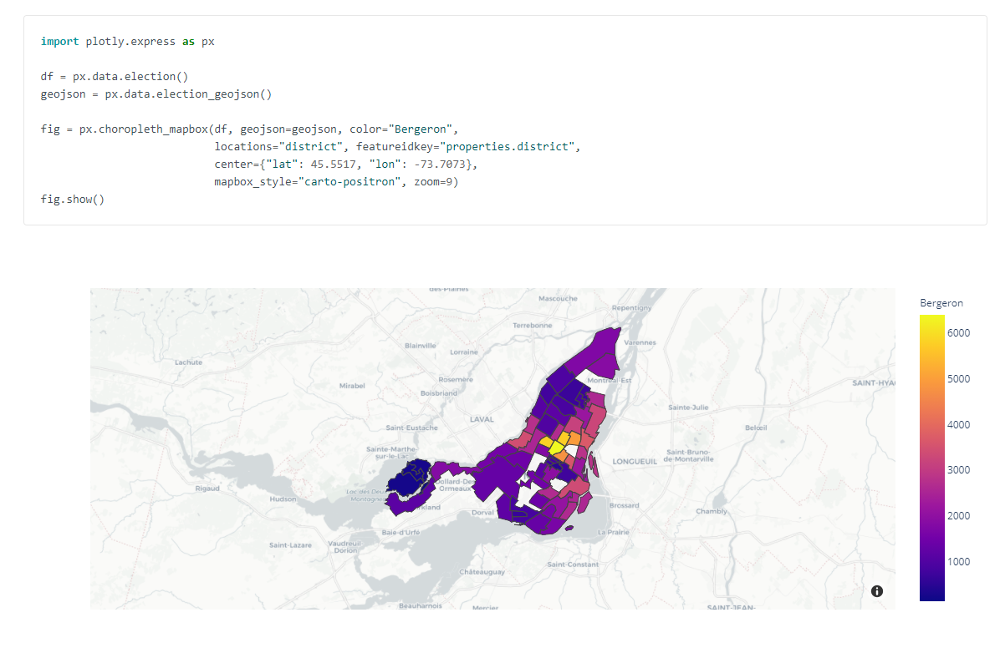



In [87]:
df.groupby(['year_week','location','new_cases'])['new_cases'].sum()

NameError: name 'df' is not defined

In [ ]:
df.groupby(['year_week','location','new_cases']).agg({'new_cases':'sum'}).reset_index

In [ ]:
df['date_pd']=pd.to_datetime(df['date'])

In [ ]:
data2.groupby(['location','year_week']).agg({'new_cases':'sum','new_deaths':'sum'})['new_deaths']['Poland'].plot()


In [ ]:
weekly_data = df.groupby("location").resample('W-Mon', label='right', closed = 'right', on='date_pd').sum().reset_index().sort_values(by='date_pd')


In [ ]:
x=df.set_index('date_pd').groupby('location').resample('W',how='sum')

In [ ]:
weekly_data.head(5)

In [ ]:

fig = px.scatter_geo(weekly_data, locations="location", color="continent", hover_name="location", size="new_cases",
               animation_frame="date_pd", projection="natural earth",scope=scater.lower())#.lower() potrzebne bo scope przyjmuje nazwy kontynentów małymi literami
#do wyboru z dasha warto dodać wybór 'scope', na mapie całej ziemi mało widać
#jak dla mnie to jesli się używa 'scope' to powinno się tez wyfiltrować dane dla danego regionu, 
#bo punkty danych dla np. samej europy są małe, bo USA ma największe wartości jeśli chodzi o new cases
#https://plotly.com/python/map-configuration/

fig.show()

Current Animation Limitations and Caveats
Animations are designed to work well when each row of input is present across all animation frames, and when categorical values mapped to symbol, color and facet are constant across frames. Animations may be misleading or inconsistent if these constraints are not met.
Although Plotly Express supports animation for many chart and map types, smooth inter-frame transitions are today only possible for scatter and bar
Plotly Express will not automatically compute the union of all x/y/color ranges, so these must be specified manually to avoid scale jumps across frames

In [ ]:
pojedynczy wykres interaktywny, na osi x data, możliwośc wyboru 3 kolumn które się będą razem rysować

In [25]:
import plotly.express as px

merged_data = merged_data.dropna(subset=['total_cases', 'total_deaths', 'location', 'continent', 'population'])
merged_data["year_month"] = merged_data["date"].str.slice(0,7)

fig = px.scatter(merged_data, x="total_cases", y="total_deaths", animation_frame="year_month", animation_group="location",
           size="population", color="continent", hover_name="location",
           log_x=True, log_y=True, size_max=55, range_x=[100,40076606], range_y=[100,100000])
fig.show()

In [28]:
poland_data = data_kraje[data_kraje["location"] == "Poland"]
poland_data = poland_data[~poland_data["date"].isin(['2021-01-29', '2021-01-30'])]

app = JupyterDash(__name__)

options = [
    {"label": "dzienne przypadki", "value": "new_cases"},
    {"label": "dzienne zgony","value": "new_deaths"},
    {"label": "dzienne hospitalizacje","value": "hosp_patients"},
    {"label": "dzienne szczepienie","value": "new_vaccinations"},
    {"label": "dzienne testy","value": "new_tests"}
]
value = ["new_cases"]

app.layout = html.Div([
    dcc.Checklist(
        id="checklist",
        options=options,
        value=value,
        labelStyle={'display': 'inline-block'}
    ),
    dcc.Graph(id="line-chart"),
])

@app.callback(
    Output("line-chart", "figure"), 
    [Input("checklist", "value")])
def update_line_chart(values):
    fig = px.area(poland_data, x="date", y=values)
    return fig

app.run_server(mode="inline")